In [3]:
#!pip install -U scikit-learn
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, MaxPooling2D, Activation
from tensorflow.keras.layers import Lambda, Input, GlobalAveragePooling2D,BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split

# for Transfer Learning
from tensorflow.keras.applications.xception  import Xception
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.applications.efficientnet import EfficientNetB7

import os
import gc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')


In [4]:
batch_size = 32
epochs = 50
img_size = (224,224)
img_shape = (224, 224, 3)

In [5]:
train_dir = '/kaggle/input/dog-breed-identification/train/'
test_dir = '/kaggle/input/dog-breed-identification/test/'
train_df = pd.read_csv("/kaggle/input/dog-breed-identification/labels.csv")

In [6]:
class_names = sorted(train_df['breed'].unique())
class_count = len(class_names)
class_to_num = dict(zip(class_names, range(class_count)))

In [7]:
train_df.value_counts(['breed'])

breed               
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
briard                   66
eskimo_dog               66
Name: count, Length: 120, dtype: int64

In [8]:
def images_to_array(directory, label_dataframe, target_size = img_shape):
    
    image_labels = label_dataframe['breed']
    images = np.zeros([len(label_dataframe), target_size[0], target_size[1], target_size[2]],dtype=np.uint8) 
    y = np.zeros([len(label_dataframe),1],dtype = np.uint8)
    for idx, img_name in enumerate(label_dataframe['id']):
        img_path = os.path.join(directory, img_name + '.jpg')
        img = load_img(img_path, target_size = target_size)
        images[idx]=img
        del img
        y[idx] = class_to_num[image_labels[idx]]
    y=to_categorical(y)
    return images, y

In [81]:
X, y = images_to_array(train_dir, train_df, img_shape)

In [75]:
#X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20, random_state=17)

In [82]:
print(X.shape)
print(y.shape)


(10222, 224, 224, 3)
(10222, 120)


In [78]:
train_datagen = ImageDataGenerator(
    rotation_range=30,
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    width_shift_range=0.2,
    height_shift_range=0.2
)

train_gen = train_datagen.flow(X_train,y=y_train,batch_size=batch_size)

val_datagen = ImageDataGenerator(rescale=1./255)

val_gen = val_datagen.flow(X_val, y_val, batch_size=batch_size)

In [82]:
#train_count = X_train.shape[0]
#val_count = X_val.shape[0]
#train_steps = train_count // batch_size
#val_steps = val_count // batch_size

In [11]:
def history_plot(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.title('Training and validation accuracy')
    plt.plot(epochs, acc, 'red', label='Training acc')
    plt.plot(epochs, val_acc, 'blue', label='Validation acc')
    plt.legend()

    plt.figure()
    plt.title('Training and validation loss')
    plt.plot(epochs, loss, 'red', label='Training loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation loss')

    plt.legend()
    plt.show()

In [12]:
def get_features(model_name, model_preprocessor, input_size, data):

    input_layer = Input(input_size)
    preprocessor = Lambda(model_preprocessor)(input_layer)
    base_model = model_name(weights='imagenet', include_top=False,
                            input_shape=input_size)(preprocessor)
    avg = GlobalAveragePooling2D()(base_model)
    feature_extractor = Model(inputs = input_layer, outputs = avg)
    
    #Extract feature.
    feature_maps = feature_extractor.predict(data, verbose=1)
    print('Feature maps shape: ', feature_maps.shape)
    return feature_maps

In [83]:
xception_preprocessor = tf.keras.applications.xception.preprocess_input
xception_features = get_features(Xception,
                                  xception_preprocessor,
                                  img_shape, X)

320/320 [==============================] - 41s 126ms/step
Feature maps shape:  (10222, 2048)


In [84]:
inception_preprocessor = tf.keras.applications.inception_v3.preprocess_input
inception_features = get_features(InceptionV3,
                                  inception_preprocessor,
                                  img_shape, X)

320/320 [==============================] - 21s 61ms/step
Feature maps shape:  (10222, 2048)


In [85]:
vgg16_preprocessor = tf.keras.applications.vgg16.preprocess_input
vgg16_features = get_features(VGG16,
                                  vgg16_preprocessor,
                                  img_shape, X)

320/320 [==============================] - 39s 123ms/step
Feature maps shape:  (10222, 512)


In [86]:
vgg19_preprocessor = tf.keras.applications.vgg19.preprocess_input
vgg19_features = get_features(VGG19,
                                  vgg19_preprocessor,
                                  img_shape, X)

320/320 [==============================] - 48s 150ms/step
Feature maps shape:  (10222, 512)


In [87]:
resnet_preprocessor = tf.keras.applications.resnet50.preprocess_input
resnet_features = get_features(ResNet50,
                                  resnet_preprocessor,
                                  img_shape, X)

320/320 [==============================] - 29s 88ms/step
Feature maps shape:  (10222, 2048)


In [88]:
mobilenet_preprocessor = tf.keras.applications.mobilenet.preprocess_input
mobilenet_features = get_features(MobileNet,
                                  mobilenet_preprocessor,
                                  img_shape, X)

320/320 [==============================] - 10s 31ms/step
Feature maps shape:  (10222, 1024)


In [89]:
densenet_preprocessor = tf.keras.applications.densenet.preprocess_input
densenet_features = get_features(DenseNet121,
                                  densenet_preprocessor,
                                  img_shape, X)

320/320 [==============================] - 29s 86ms/step
Feature maps shape:  (10222, 1024)


In [90]:
efficientnet_preprocessor = tf.keras.applications.efficientnet.preprocess_input
efficientnet_features = get_features(EfficientNetB7,
                                  efficientnet_preprocessor,
                                  img_shape, X)

320/320 [==============================] - 114s 337ms/step
Feature maps shape:  (10222, 2560)


In [21]:
del(X)
gc.collect()

63614

In [91]:
final_features = np.concatenate([xception_features,
                                 inception_features,
                                 vgg16_features,
                                 vgg19_features,
                                 resnet_features,
                                 mobilenet_features,
                                 densenet_features,
                                 efficientnet_features], axis=-1) #axis=-1 to concatinate horizontally

print('Final feature maps shape', final_features.shape)

Final feature maps shape (10222, 11776)


In [92]:
model = Sequential()
model.add(Dropout(0.5,input_shape=(final_features.shape[1],)))
model.add(Dense(class_count,activation= 'softmax'))

In [93]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dropout_3 (Dropout)         (None, 11776)             0         
                                                                 
 dense_3 (Dense)             (None, 120)               1413240   
                                                                 
Total params: 1413240 (5.39 MB)
Trainable params: 1413240 (5.39 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [94]:
learn_rate=.001
sgd=optimizers.SGD(lr=learn_rate,momentum=.9,nesterov=False)
adam=optimizers.Adam(lr=learn_rate)
model.compile(optimizer = adam, loss='categorical_crossentropy', 
              metrics=['accuracy'])

In [95]:
checkpoint = ModelCheckpoint('final_model.h5', monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=.01, patience=3, min_lr=1e-5,verbose = 1)

stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)                
                        
history = model.fit(final_features, y, 
                    epochs=50,
                    validation_split=0.2,
                    callbacks=[checkpoint, stop, reduce_lr])


Epoch 1/50
241/256 [===========================>..] - ETA: 0s - loss: 3.8971 - accuracy: 0.5312
Epoch 1: val_accuracy improved from -inf to 0.72665, saving model to final_model.h5
256/256 [==============================] - 2s 5ms/step - loss: 3.8177 - accuracy: 0.5393 - val_loss: 1.9645 - val_accuracy: 0.7267 - lr: 0.0010
Epoch 2/50
255/256 [============================>.] - ETA: 0s - loss: 1.3776 - accuracy: 0.7987
Epoch 2: val_accuracy improved from 0.72665 to 0.76235, saving model to final_model.h5
256/256 [==============================] - 1s 4ms/step - loss: 1.3760 - accuracy: 0.7987 - val_loss: 1.8711 - val_accuracy: 0.7623 - lr: 0.0010
Epoch 3/50
255/256 [============================>.] - ETA: 0s - loss: 1.0353 - accuracy: 0.8433
Epoch 3: val_accuracy improved from 0.76235 to 0.76773, saving model to final_model.h5
256/256 [==============================] - 1s 4ms/step - loss: 1.0369 - accuracy: 0.8431 - val_loss: 2.3146 - val_accuracy: 0.7677 - lr: 0.0010
Epoch 4/50
255/256 [==

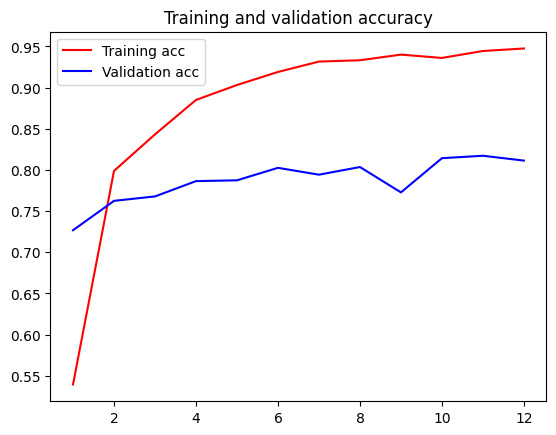

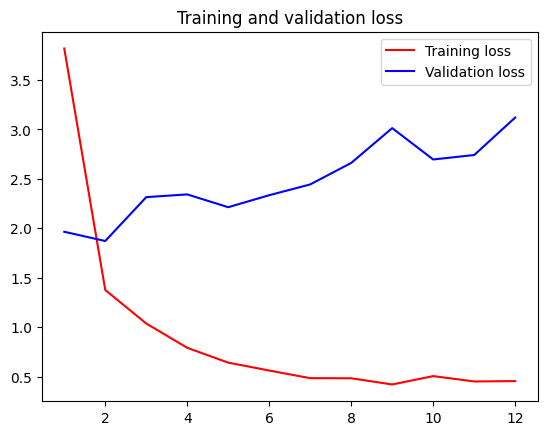

In [96]:
history_plot(history)

In [ ]:
del xception_features
del inception_features
del vgg16_features
del vgg19_features
del resnet_features
del mobilenet_features
del densenet_features
del efficientnet_features
del final_features
gc.collect()

In [97]:
def test_images_to_array(directory, target_size = img_shape):
    test_filenames = [directory + fname for fname in os.listdir(directory)]

    data_size = len(test_filenames)
    images = np.zeros([data_size, target_size[0], target_size[1], target_size[2]], dtype=np.uint8)
    
    
    for idx,img_path in enumerate(test_filenames):
        img = load_img(img_path, target_size = target_size)
        images[idx]=img
        del img
    print('Ouptut Data Size: ', images.shape)
    return images

test_data = test_images_to_array(test_dir, img_shape)

Ouptut Data Size:  (10357, 224, 224, 3)


In [98]:

def extact_features(data):
    xception_features = get_features(Xception,
                                     xception_preprocessor,
                                     img_shape, data)
    inception_features = get_features(InceptionV3,
                                      inception_preprocessor,
                                      img_shape, data)
    vgg16_features = get_features(VGG16,
                                  vgg16_preprocessor,
                                  img_shape, data)
    vgg19_features = get_features(VGG19,
                                  vgg19_preprocessor,
                                  img_shape, data)
    resnet_features = get_features(ResNet50,
                                   resnet_preprocessor,
                                   img_shape, data)
    mobilenet_features = get_features(MobileNet,
                                      mobilenet_preprocessor,
                                      img_shape, data)
    densenet_features = get_features(DenseNet121,
                                     densenet_preprocessor,
                                     img_shape, data)
    efficientnet_features = get_features(EfficientNetB7,
                                         efficientnet_preprocessor,
                                         img_shape, data)

    final_features = np.concatenate([xception_features,
                                 inception_features,
                                 vgg16_features,
                                 vgg19_features,
                                 resnet_features,
                                 mobilenet_features,
                                 densenet_features,
                                 efficientnet_features], axis=-1)
    
    print('Final feature maps shape', final_features.shape)
    
    #deleting to free up ram memory
    del xception_features
    del inception_features
    del vgg16_features,
    del vgg19_features
    del resnet_features
    del mobilenet_features
    del densenet_features
    del efficientnet_features
    gc.collect()
    
    
    return final_features

test_features = extact_features(test_data)

324/324 [==============================] - 46s 139ms/step
Feature maps shape:  (10357, 2048)
324/324 [==============================] - 22s 64ms/step
Feature maps shape:  (10357, 2048)
324/324 [==============================] - 44s 135ms/step
Feature maps shape:  (10357, 512)
324/324 [==============================] - 48s 148ms/step
Feature maps shape:  (10357, 512)
324/324 [==============================] - 30s 91ms/step
Feature maps shape:  (10357, 2048)
324/324 [==============================] - 11s 32ms/step
Feature maps shape:  (10357, 1024)
324/324 [==============================] - 31s 91ms/step
Feature maps shape:  (10357, 1024)
324/324 [==============================] - 115s 341ms/step
Feature maps shape:  (10357, 2560)
Final feature maps shape (10357, 11776)


In [99]:
pred = model.predict(test_features)

324/324 [==============================] - 1s 2ms/step


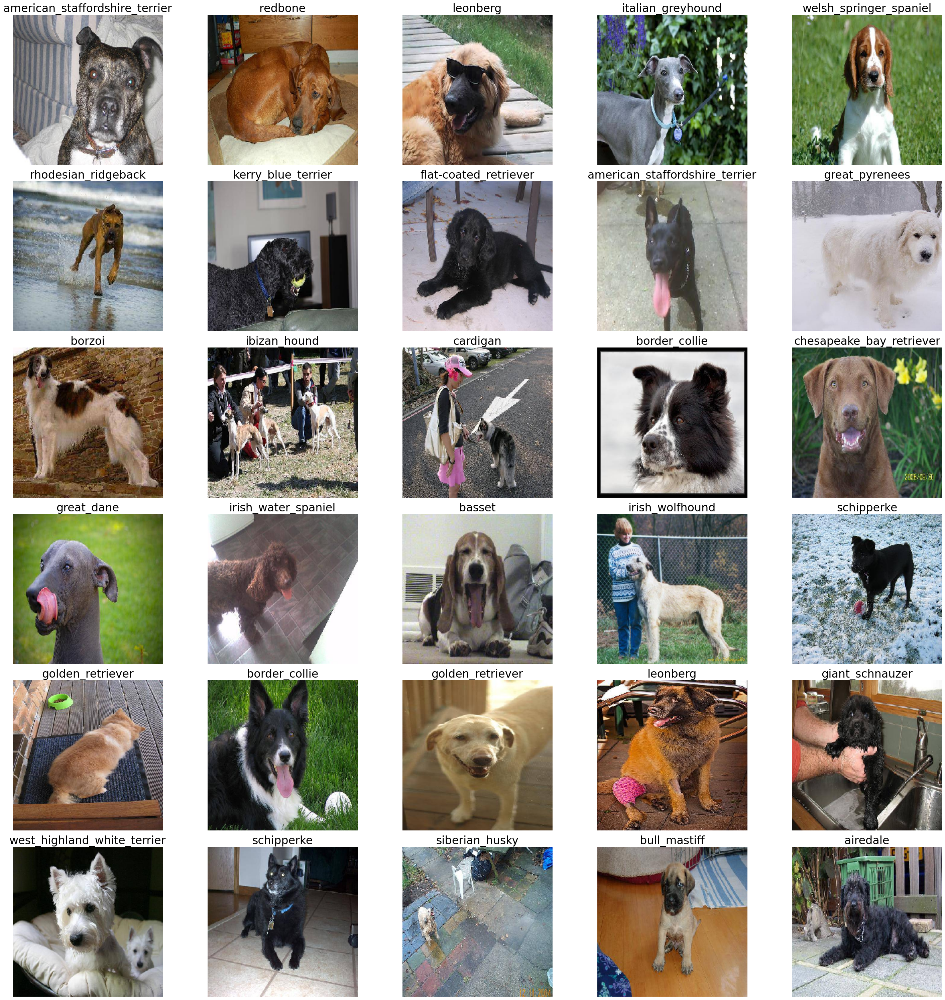

In [113]:
plt.figure(figsize=(30, 30))
for i in range(30):
    plt.subplot(6, 5, i + 1)
    plt.title(class_names[np.argmax(pred[i])],fontsize = 24)
    plt.imshow(test_data[i].astype('int32'))
    plt.axis('off')
plt.tight_layout()
plt.show()
